In [1]:
import pandas as pd

In [3]:
pip install xlrd

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 2.3 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
df = pd.read_csv(r'/mnt/c/Users/Emil/10X/chuchu_analysis.csv', header = 0) # index_col=0

In [3]:
df

,ID,ANN9,BoneDistance,DMP1Distance,FGF23Distance
0,7,36.4243,-18.03270,20.23640,6.074470
1,21,33.3215,-18.75840,18.36890,7.099430
2,22,31.6114,-14.44920,7.47300,0.626898
3,27,104.3680,-17.41980,65.92280,29.484900
4,85,62.7064,-9.54933,14.38490,32.850900
...,...,...,...,...,...
26188,79617,66.7356,-4.76336,19.94410,17.335000
26189,79618,78.6352,-11.16660,22.85040,3.452630
26190,79624,75.6149,-14.68210,10.99380,3.501350
26191,79625,77.1331,-5.35104,10.93510,20.116900


In [4]:
from sklearn.datasets import load_iris
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [5]:
import plotly.express as px
fig = px.scatter_matrix(df.drop("ID",axis=1),
width=1200, height=1600)
fig.show()

In [6]:
fig1 = px.scatter(df, x="BoneDistance", y="DMP1Distance", color="FGF23Distance",
                 size="ANN9")
fig1.update_layout(title="4 Features Representation")
fig1.show()

In [7]:
fig2 = px.scatter_3d(df, x="BoneDistance", y="DMP1Distance",z="FGF23Distance",
                     color="ANN9",size="ANN9")
fig2.update_layout(title="5 Features Representation")
fig2.show()

In [8]:

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
import plotly.graph_objects as go
import numpy as np
X=df.drop("ID",axis=1)
scaler = MinMaxScaler()
scaler.fit(X)
X=scaler.transform(X)
inertia = []
for i in range(1,11):
    kmeans = KMeans(
        n_clusters=i, init="k-means++",
        n_init=10,
        tol=1e-04, random_state=42
    )
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)
fig = go.Figure(data=go.Scatter(x=np.arange(1,11),y=inertia))
fig.update_layout(title="Inertia vs Cluster Number",xaxis=dict(range=[0,11],title="Cluster Number"),
                  yaxis={'title':'Inertia'},
                 annotations=[
        dict(
            x=3,
            y=inertia[2],
            xref="x",
            yref="y",
            text="Elbow!",
            showarrow=True,
            arrowhead=7,
            ax=20,
            ay=-40
        )
    ])

In [9]:
kmeans = KMeans(
        n_clusters=3, init="k-means++",
        n_init=10,
        tol=1e-04, random_state=42
    )
kmeans.fit(X)
clusters=pd.DataFrame(X,columns=df.drop("ID",axis=1).columns)
clusters['label']=kmeans.labels_
polar=clusters.groupby("label").mean().reset_index()
polar=pd.melt(polar,id_vars=["label"])
fig4 = px.line_polar(polar, r="value", theta="variable", color="label", line_close=True,height=800,width=1400)


In [10]:
fig4.show()

In [29]:
df1 = df.sample(n = 2000)

In [30]:
df1

,ID,ANN9,BoneDistance,DMP1Distance,FGF23Distance
14249,41866,30.9838,-45.1997,39.51500,32.27380
15018,46042,33.2732,-74.0747,40.89050,17.59280
16423,51115,33.2951,-62.6946,75.01360,71.94850
21052,64927,34.0052,-45.5245,28.62680,37.13910
17753,55519,40.5499,-41.9315,15.21990,2.58394
...,...,...,...,...,...
18010,56332,37.1362,-47.9757,49.57100,70.82270
25510,77522,33.4160,-31.3291,11.69290,1.86943
600,1290,34.1683,-66.3473,37.60870,34.80460
74,315,31.0385,-47.7492,7.97687,4.43715


In [31]:
X = df1.iloc[:,1:5].values

In [32]:
y = df1.iloc[:,0].values

In [33]:
X

array([[ 30.9838 , -45.1997 ,  39.515  ,  32.2738 ],
       [ 33.2732 , -74.0747 ,  40.8905 ,  17.5928 ],
       [ 33.2951 , -62.6946 ,  75.0136 ,  71.9485 ],
       ...,
       [ 34.1683 , -66.3473 ,  37.6087 ,  34.8046 ],
       [ 31.0385 , -47.7492 ,   7.97687,   4.43715],
       [ 28.8373 , -52.264  ,  44.29   ,  23.4639 ]])

In [34]:
y

array([41866, 46042, 51115, ...,  1290,   315, 19954])

In [35]:
from sklearn.model_selection import train_test_split
  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [36]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
  
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [37]:
from sklearn.decomposition import PCA
  
pca = PCA(n_components = 2)
  
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
  
explained_variance = pca.explained_variance_ratio_

In [38]:
from sklearn.linear_model import LogisticRegression  
  
classifier = LogisticRegression(random_state = 0)


In [39]:
classifier.fit(X_train, y_train)

LogisticRegression(random_state=0)

In [40]:
y_pred = classifier.predict(X_test)

In [41]:
from sklearn.metrics import confusion_matrix
  
cm = confusion_matrix(y_test, y_pred)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

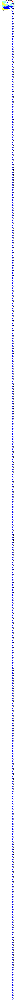

In [42]:
from matplotlib.colors import ListedColormap
  
X_set, y_set = X_train, y_train
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1,
                     stop = X_set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_set[:, 1].min() - 1,
                     stop = X_set[:, 1].max() + 1, step = 0.01))
  
plt.contourf(X1, X2, classifier.predict(np.array([X1.ravel(),
             X2.ravel()]).T).reshape(X1.shape), alpha = 0.75,
             cmap = ListedColormap(('yellow', 'white', 'aquamarine')))
  
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
  
for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
                c = ListedColormap(('red', 'green', 'blue'))(i), label = j)
  
plt.title('Logistic Regression (Training set)')
plt.xlabel('PC1') # for Xlabel
plt.ylabel('PC2') # for Ylabel
plt.legend() # to show legend
  
# show scatter plot
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

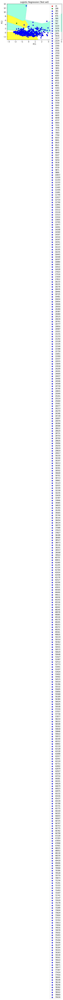

In [43]:
from matplotlib.colors import ListedColormap
  
X_set, y_set = X_test, y_test
  
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1,
                     stop = X_set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_set[:, 1].min() - 1,
                     stop = X_set[:, 1].max() + 1, step = 0.01))
  
plt.contourf(X1, X2, classifier.predict(np.array([X1.ravel(),
             X2.ravel()]).T).reshape(X1.shape), alpha = 0.75,
             cmap = ListedColormap(('yellow', 'white', 'aquamarine'))) 
  
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
  
for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
                c = ListedColormap(('red', 'green', 'blue'))(i), label = j)
  
# title for scatter plot
plt.title('Logistic Regression (Test set)') 
plt.xlabel('PC1') # for Xlabel
plt.ylabel('PC2') # for Ylabel
plt.legend()
  
# show scatter plot
plt.show()

In [47]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df1[feat_cols].values)

df1['pca-one'] = pca_result[:,0]
df1['pca-two'] = pca_result[:,1] 
df1['pca-three'] = pca_result[:,2]

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))



KeyError: "None of [Index(['pixel0', 'pixel1', 'pixel2', 'pixel3'], dtype='object')] are in the [columns]"

In [45]:
feat_cols = [ 'pixel'+str(i) for i in range(X.shape[1]) ]

In [51]:
rndperm = np.random.permutation(df.shape[0])

In [53]:
df

,ID,ANN9,BoneDistance,DMP1Distance,FGF23Distance
0,7,36.4243,-18.03270,20.23640,6.074470
1,21,33.3215,-18.75840,18.36890,7.099430
2,22,31.6114,-14.44920,7.47300,0.626898
3,27,104.3680,-17.41980,65.92280,29.484900
4,85,62.7064,-9.54933,14.38490,32.850900
...,...,...,...,...,...
26188,79617,66.7356,-4.76336,19.94410,17.335000
26189,79618,78.6352,-11.16660,22.85040,3.452630
26190,79624,75.6149,-14.68210,10.99380,3.501350
26191,79625,77.1331,-5.35104,10.93510,20.116900


In [58]:
from sklearn.manifold import TSNE

In [55]:
X

array([[ 30.9838 , -45.1997 ,  39.515  ,  32.2738 ],
       [ 33.2732 , -74.0747 ,  40.8905 ,  17.5928 ],
       [ 33.2951 , -62.6946 ,  75.0136 ,  71.9485 ],
       ...,
       [ 34.1683 , -66.3473 ,  37.6087 ,  34.8046 ],
       [ 31.0385 , -47.7492 ,   7.97687,   4.43715],
       [ 28.8373 , -52.264  ,  44.29   ,  23.4639 ]])

In [56]:
y

array([41866, 46042, 51115, ...,  1290,   315, 19954])

In [60]:
tsne = TSNE(n_components=2, verbose=1, random_state=123)
z = tsne.fit_transform(X) 

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2000 samples in 0.012s...
[t-SNE] Computed neighbors for 2000 samples in 0.070s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2000
[t-SNE] Computed conditional probabilities for sample 2000 / 2000
[t-SNE] Mean sigma: 8.200897
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.471519
[t-SNE] KL divergence after 1000 iterations: 0.927890


[Text(0.5, 1.0, 'Data T-SNE projection')]

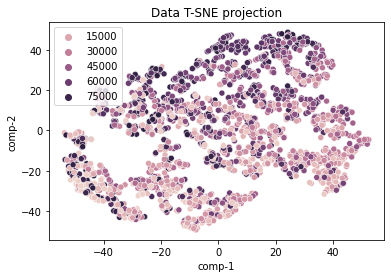

In [73]:
tsnedf = pd.DataFrame()
tsnedf["y"] = y
tsnedf["comp-1"] = z[:,0]
tsnedf["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=tsnedf.y.tolist(), 
                data=tsnedf).set(title="Data T-SNE projection") 

In [76]:
z

array([[ -6.0493484,   4.152171 ],
       [  3.067064 , -11.883503 ],
       [ 24.319618 ,  28.893278 ],
       ...,
       [  1.7480874,  -7.4415226],
       [-34.121613 , -39.888866 ],
       [ -6.0351562,  -3.5607238]], dtype=float32)

In [74]:
tsnedf

,y,comp-1,comp-2
0,41866,-6.049348,4.152171
1,46042,3.067064,-11.883503
2,51115,24.319618,28.893278
3,64927,-10.122984,8.208394
4,55519,-34.648579,-30.743654
...,...,...,...
1995,56332,11.328012,20.084084
1996,77522,-43.818844,-28.547815
1997,1290,1.748087,-7.441523
1998,315,-34.121613,-39.888866


In [77]:
pca = PCA().fit(df1)

In [78]:
pca

PCA()

In [79]:
pcaratio = pca.explained_variance_ratio_
trace = go.Scatter(x=np.arange(len(pcaratio)),y=np.cumsum(pcaratio))
data = [trace]
layout = dict(title="Player Skills Dataset - PCA Explained Variance || 89% achieved at 5 components")
fig = dict(data=data, layout=layout)

In [83]:
fig.show()

AttributeError: 'dict' object has no attribute 'show'

In [84]:
dfnoid = pd.read_csv(r'/mnt/c/Users/Emil/10X/chuchu_analysis.csv', header = 0, index_col=0) # 

In [85]:
dfnoid

,ANN9,BoneDistance,DMP1Distance,FGF23Distance
ID,,,,
7,36.4243,-18.03270,20.23640,6.074470
21,33.3215,-18.75840,18.36890,7.099430
22,31.6114,-14.44920,7.47300,0.626898
27,104.3680,-17.41980,65.92280,29.484900
85,62.7064,-9.54933,14.38490,32.850900
...,...,...,...,...
79617,66.7356,-4.76336,19.94410,17.335000
79618,78.6352,-11.16660,22.85040,3.452630
79624,75.6149,-14.68210,10.99380,3.501350


In [86]:
df2 = dfnoid.sample(n = 2000)

In [87]:
df2

,ANN9,BoneDistance,DMP1Distance,FGF23Distance
ID,,,,
34131,25.9337,-58.21340,103.6100,46.70230
28549,33.2307,-97.42010,87.2838,27.95750
49402,161.6560,-7.92285,95.7320,101.20200
24548,38.3807,-87.42440,115.7630,52.10750
29786,31.6022,-41.30240,11.7057,9.67956
...,...,...,...,...
25284,37.1714,-53.48590,51.4082,2.34626
23648,37.4153,-101.19800,106.5300,98.82780
2360,35.9989,-46.67790,25.5498,46.65930


In [89]:
from plotly.offline import init_notebook_mode, iplot

In [90]:
corr = df2.corr()
trace = go.Heatmap(z=corr,x=corr.index,y=corr.columns)
data = [trace]
layout = dict(title="Correlation Plot of Player Skills")
fig = dict(data=data, layout=layout)
iplot(fig)

In [91]:
from sklearn.decomposition import PCA
pca = PCA().fit(df2)

In [92]:
pcaratio = pca.explained_variance_ratio_
trace = go.Scatter(x=np.arange(len(pcaratio)),y=np.cumsum(pcaratio))
data = [trace]
layout = dict(title="Player Skills Dataset - PCA Explained Variance || 89% achieved at 5 components")
fig = dict(data=data, layout=layout)
iplot(fig)

In [158]:
pca = PCA(n_components=4)
skillsPCA = pca.fit_transform(df2)

In [95]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3)
skillsPCA_labels = kmeans.fit_predict(skillsPCA)

In [160]:
dfskillsPCA = pd.DataFrame(skillsPCA)
dfskillsPCA['cluster'] = skillsPCA_labels

In [161]:
X1 = dfskillsPCA.iloc[:,:-1]

In [162]:
X1

,0,1,2,3
0,45.301521,14.882984,21.901470,-16.831109
1,28.673791,50.608940,0.074289,-3.449305
2,69.277096,-66.644192,35.029184,111.963755
3,63.714175,36.922822,10.226616,-1.863162
4,-50.391610,-3.612425,-0.813494,-5.877923
...,...,...,...,...
1995,-22.424920,20.750410,19.682824,-2.171591
1996,88.379763,18.620939,-28.662315,-0.136991
1997,-15.647589,-16.760061,-15.345106,-1.851492
1998,73.212367,-36.666758,-2.612395,0.709953


In [163]:
from sklearn.manifold import TSNE
X1 = dfskillsPCA.iloc[:,:-1]
Xtsne = TSNE(n_components=2).fit_transform(X1)
dftsne = pd.DataFrame(Xtsne)
dftsne['cluster'] = skillsPCA_labels
dftsne.columns = ['x1','x2','cluster']

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [164]:
pca2 = PCA(n_components=2)
skillsPCA2 = pca2.fit_transform(df2)
dfskillsPCA2 = pd.DataFrame(skillsPCA2)
dfskillsPCA2['cluster'] = skillsPCA_labels
dfskillsPCA2.columns = ['x1','x2','cluster']

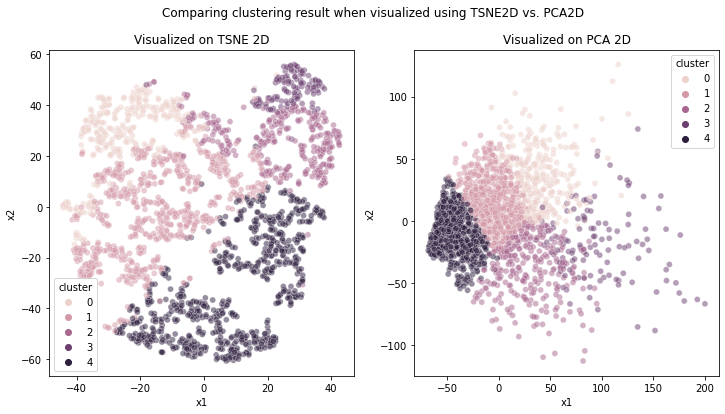

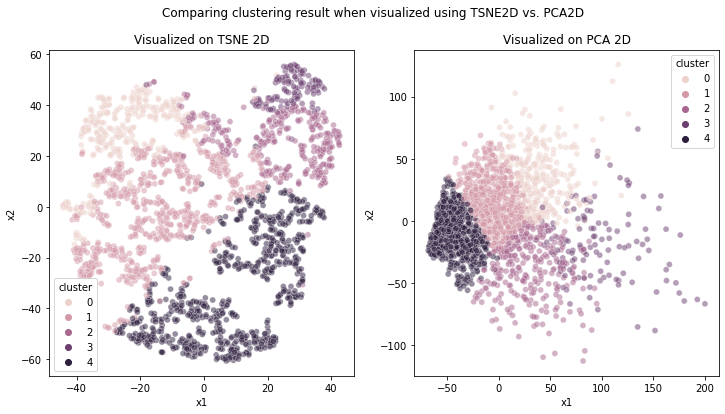

In [101]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))
sns.scatterplot(data=dftsne,x='x1',y='x2',hue='cluster',legend="full",alpha=0.5,ax=ax[0])
ax[0].set_title('Visualized on TSNE 2D')
sns.scatterplot(data=dfskillsPCA2,x='x1',y='x2',hue='cluster',legend="full",alpha=0.5,ax=ax[1])
ax[1].set_title('Visualized on PCA 2D')
fig.suptitle('Comparing clustering result when visualized using TSNE2D vs. PCA2D')
display(fig)

In [107]:
df2['cluster'] = clustering_ori

In [128]:
dftsne

,x1,x2,cluster
0,-16.228319,26.120739,0
1,-33.062679,28.091164,0
2,27.590675,26.576580,3
3,-25.574230,32.178085,0
4,-4.197493,-51.683006,4
...,...,...,...
1995,-19.405052,-24.919842,1
1996,-20.721651,45.509632,0
1997,11.046684,2.541727,4
1998,31.286308,38.442398,2


In [127]:
df_tsneclusters = df2

In [129]:
df_tsneclusters['tsne'] = dftsne['cluster']

In [108]:
df2

,ANN9,BoneDistance,DMP1Distance,FGF23Distance,cluster
ID,,,,,
34131,25.9337,-58.21340,103.6100,46.70230,2
28549,33.2307,-97.42010,87.2838,27.95750,2
49402,161.6560,-7.92285,95.7320,101.20200,4
24548,38.3807,-87.42440,115.7630,52.10750,2
29786,31.6022,-41.30240,11.7057,9.67956,3
...,...,...,...,...,...
25284,37.1714,-53.48590,51.4082,2.34626,0
23648,37.4153,-101.19800,106.5300,98.82780,2
2360,35.9989,-46.67790,25.5498,46.65930,3


In [126]:
dfskillsPCA2

,x1,x2,cluster
0,45.301521,14.882984,0
1,28.673791,50.608940,0
2,69.277096,-66.644192,3
3,63.714175,36.922822,0
4,-50.391610,-3.612425,4
...,...,...,...
1995,-22.424920,20.750410,1
1996,88.379763,18.620939,0
1997,-15.647589,-16.760061,4
1998,73.212367,-36.666758,2


In [112]:
def outside_limit(df, label_col, label, sensitivity):
  feature_list = df2.columns[:-1]
  
  plot_list = []
  mean_overall_list = []
  mean_cluster_list = []
  
  for i,varname in enumerate(feature_list):
    
    #     get overall mean for a variable, set lower and upper limit
    mean_overall = df[varname].mean()
    lower_limit = mean_overall - (mean_overall*sensitivity)
    upper_limit = mean_overall + (mean_overall*sensitivity)

    #     get cluster mean for a variable
    cluster_filter = df[label_col]==label
    pd_cluster = df[cluster_filter]
    mean_cluster = pd_cluster[varname].mean()
    
    #     create filter to display graph with 0.5 deviation from the mean
    if mean_cluster <= lower_limit or mean_cluster >= upper_limit:
      plot_list.append(varname)
      mean_overall_std = mean_overall/mean_overall
      mean_cluster_std = mean_cluster/mean_overall
      mean_overall_list.append(mean_overall_std)
      mean_cluster_list.append(mean_cluster_std)
   
  mean_df = pd.DataFrame({'feature_list':plot_list,
                         'mean_overall_list':mean_overall_list,
                         'mean_cluster_list':mean_cluster_list})
  mean_df = mean_df.sort_values(by=['mean_cluster_list'], ascending=False)
  
  return mean_df

def plot_barchart_all_unique_features(df, label_col, label, ax, sensitivity):
  
  mean_df = outside_limit(df, label_col, label, sensitivity)
  mean_df_to_plot = mean_df.drop(['mean_overall_list'], axis=1)
  
  if len(mean_df.index) != 0:
    sns.barplot(y='feature_list', x='mean_cluster_list', data=mean_df_to_plot, palette=sns.cubehelix_palette(20, start=.5, rot=-.75, reverse=True), \
                alpha=0.75, dodge=True, ax=ax)

    for i,p in enumerate(ax.patches):
      ax.annotate("{:.02f}".format((p.get_width())), 
                  (1, p.get_y() + p.get_height() / 2.), xycoords=('axes fraction', 'data'),
                  ha='right', va='top', fontsize=10, color='black', rotation=0, 
                  xytext=(0, 0),
                  textcoords='offset pixels')
  
  ax.set_title('Unique Characteristics of Cluster ' + str(label))
  ax.set_xlabel('Standardized Mean')
  ax.axvline(x=1, color='k')

def plot_features_all_cluster(df, label_col, n_clusters, sensitivity):
  n_plot = n_clusters
  fig, ax = plt.subplots(n_plot, 1, figsize=(12, n_plot*6), sharex='col')
  ax= ax.ravel()
  
  label = np.arange(n_clusters)
  for i in label:
    plot_barchart_all_unique_features(df, label_col, label=i, ax=ax[i], sensitivity=sensitivity)
    ax[i].xaxis.set_tick_params(labelbottom=True)
    
  plt.tight_layout()
  display(fig)

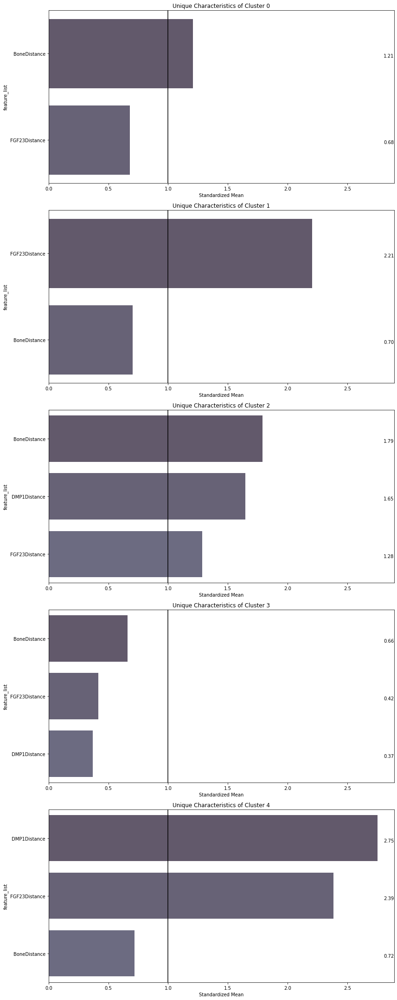

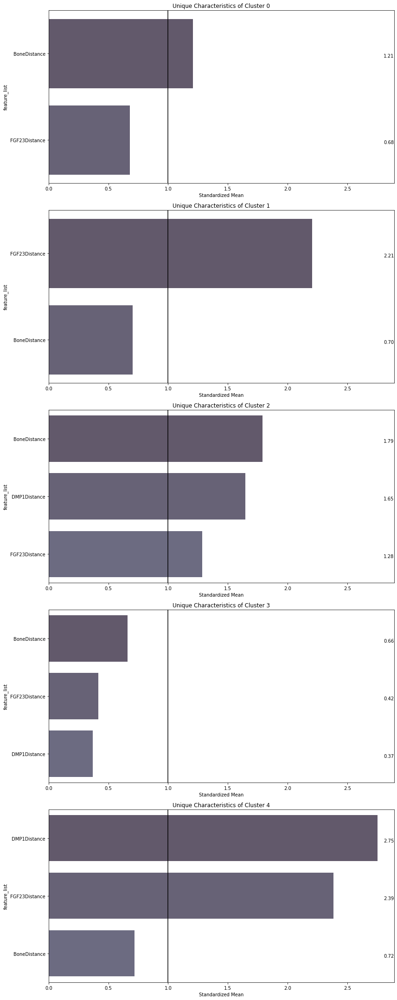

In [113]:
plot_features_all_cluster(df=df2, label_col='cluster', n_clusters=5, sensitivity=0.2)

In [111]:
df2

,ANN9,BoneDistance,DMP1Distance,FGF23Distance,cluster
ID,,,,,
34131,25.9337,-58.21340,103.6100,46.70230,2
28549,33.2307,-97.42010,87.2838,27.95750,2
49402,161.6560,-7.92285,95.7320,101.20200,4
24548,38.3807,-87.42440,115.7630,52.10750,2
29786,31.6022,-41.30240,11.7057,9.67956,3
...,...,...,...,...,...
25284,37.1714,-53.48590,51.4082,2.34626,0
23648,37.4153,-101.19800,106.5300,98.82780,2
2360,35.9989,-46.67790,25.5498,46.65930,3


In [115]:
avgs = df2.groupby('cluster').mean()

In [130]:
avgstsne = df_tsneclusters.groupby('tsne').mean()

In [116]:
avgs

,ANN9,BoneDistance,DMP1Distance,FGF23Distance
cluster,,,,
0,36.479524,-64.675168,52.027710,26.353867
1,41.548565,-37.590148,55.667185,85.355156
2,39.144213,-95.978397,83.927493,49.676341
3,39.284748,-35.376060,18.760319,16.159217
4,46.488195,-38.452174,140.213366,92.300034


In [131]:
avgstsne

,ANN9,BoneDistance,DMP1Distance,FGF23Distance,cluster
tsne,,,,,
0.0,33.206056,-42.012656,18.601674,10.007552,2.437500
1.0,35.209592,-50.961981,22.803079,14.000056,1.961538
2.0,35.817321,-40.576650,22.452492,12.094308,2.357143
3.0,37.447600,-40.950520,19.093638,14.104864,2.400000
4.0,34.854352,-49.846530,25.501201,12.398864,1.956522


<AxesSubplot:xlabel='cluster'>

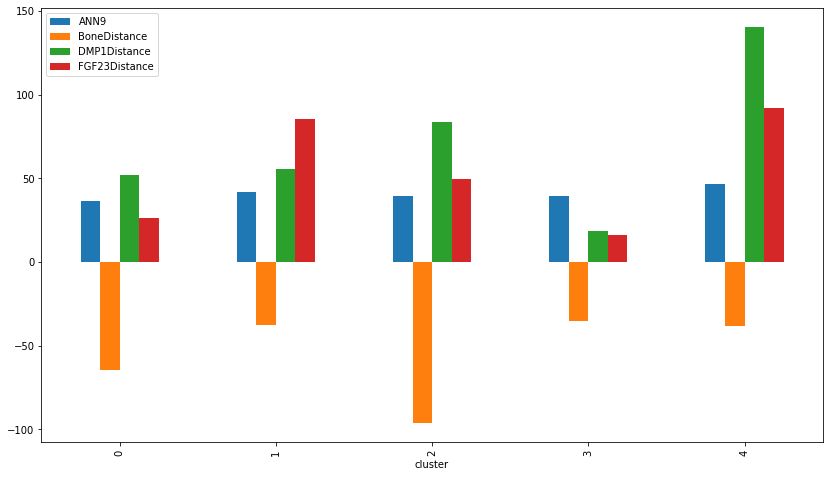

In [125]:
avgs.plot.bar(figsize = (14,8))

<AxesSubplot:xlabel='tsne'>

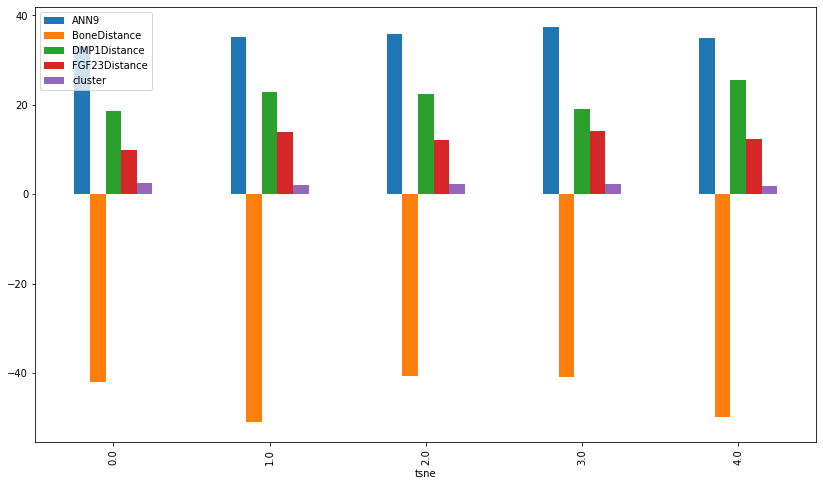

In [132]:
avgstsne.plot.bar(figsize = (14,8))

In [149]:
kmeans = KMeans(n_clusters=3)
clustering_ori = kmeans.fit_predict(dffor3clusters)

In [157]:
df2 = df2.iloc[:,0:4]

In [148]:
dffor3clusters = df2.iloc[:,0:4]

In [150]:
clustering_ori

array([0, 0, 1, ..., 2, 1, 2], dtype=int32)

In [151]:
dffor3clusters['cluster'] = clustering_ori

In [152]:
avgsdffor3clusters = dffor3clusters.groupby('cluster').mean()

In [153]:
avgsdffor3clusters

,ANN9,BoneDistance,DMP1Distance,FGF23Distance
cluster,,,,
0,37.547204,-80.398683,69.041531,38.689334
1,43.923190,-38.882609,95.643686,96.801676
2,38.839392,-40.086797,25.840651,21.719520


<AxesSubplot:xlabel='cluster'>

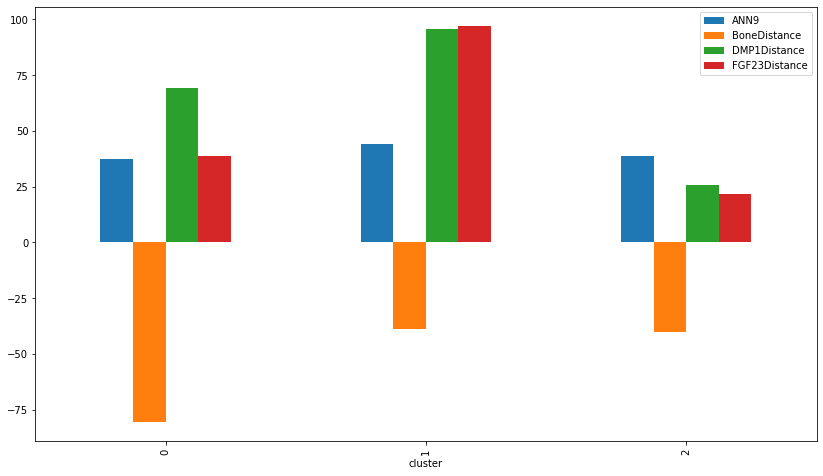

In [154]:
avgsdffor3clusters.plot.bar(figsize = (14,8))

In [159]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3)
skillsPCA_labels = kmeans.fit_predict(skillsPCA)

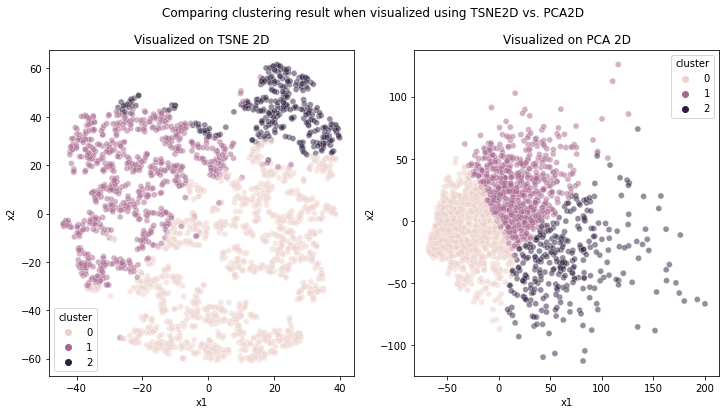

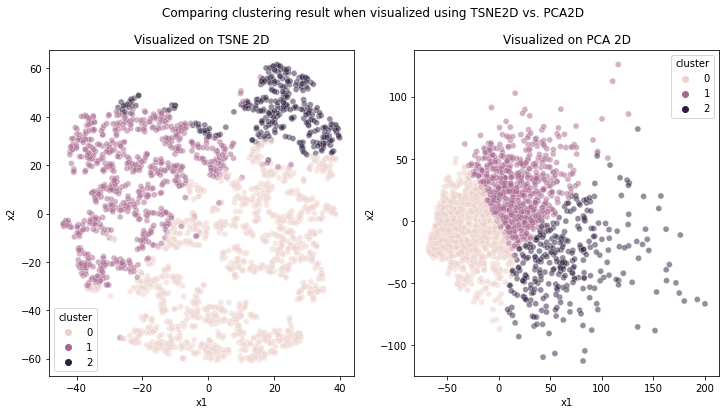

In [165]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))
sns.scatterplot(data=dftsne,x='x1',y='x2',hue='cluster',legend="full",alpha=0.5,ax=ax[0])
ax[0].set_title('Visualized on TSNE 2D')
sns.scatterplot(data=dfskillsPCA2,x='x1',y='x2',hue='cluster',legend="full",alpha=0.5,ax=ax[1])
ax[1].set_title('Visualized on PCA 2D')
fig.suptitle('Comparing clustering result when visualized using TSNE2D vs. PCA2D')
display(fig)

In [169]:
df_tsneclusters2['tsne'] = dftsne['cluster']

In [168]:
df_tsneclusters2 = df_tsneclusters

In [170]:
avgstsne2 = df_tsneclusters2.groupby('tsne').mean()

<AxesSubplot:xlabel='tsne'>

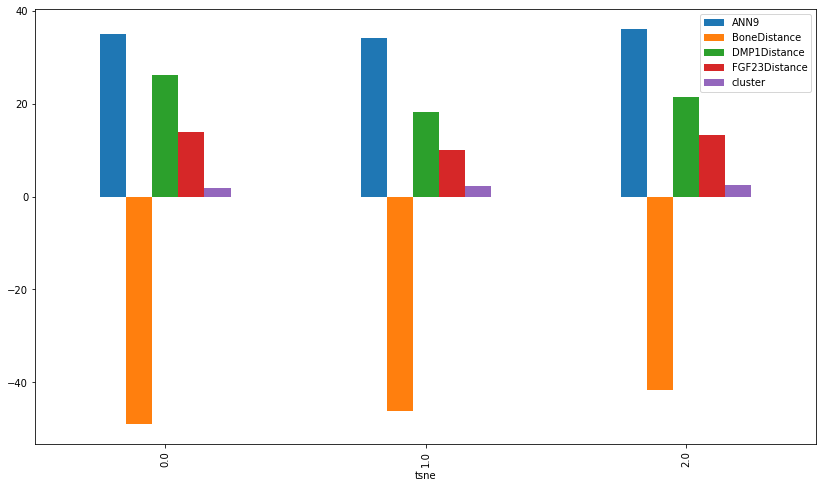

In [171]:
avgstsne2.plot.bar(figsize = (14,8))

In [172]:
df_tsneclusters2

,ANN9,BoneDistance,DMP1Distance,FGF23Distance,cluster,tsne
ID,,,,,,
34131,25.9337,-58.21340,103.6100,46.70230,2,NaN
28549,33.2307,-97.42010,87.2838,27.95750,2,NaN
49402,161.6560,-7.92285,95.7320,101.20200,4,NaN
24548,38.3807,-87.42440,115.7630,52.10750,2,NaN
29786,31.6022,-41.30240,11.7057,9.67956,3,NaN
...,...,...,...,...,...,...
25284,37.1714,-53.48590,51.4082,2.34626,0,NaN
23648,37.4153,-101.19800,106.5300,98.82780,2,NaN
2360,35.9989,-46.67790,25.5498,46.65930,3,NaN


In [173]:
dfpcaclusters = df_tsneclusters2.iloc[:,0:4]

In [174]:
dfpcaclusters

,ANN9,BoneDistance,DMP1Distance,FGF23Distance
ID,,,,
34131,25.9337,-58.21340,103.6100,46.70230
28549,33.2307,-97.42010,87.2838,27.95750
49402,161.6560,-7.92285,95.7320,101.20200
24548,38.3807,-87.42440,115.7630,52.10750
29786,31.6022,-41.30240,11.7057,9.67956
...,...,...,...,...
25284,37.1714,-53.48590,51.4082,2.34626
23648,37.4153,-101.19800,106.5300,98.82780
2360,35.9989,-46.67790,25.5498,46.65930


In [175]:
dfskillsPCA2

,x1,x2,cluster
0,45.301521,14.882984,1
1,28.673791,50.608940,1
2,69.277096,-66.644192,2
3,63.714175,36.922822,1
4,-50.391610,-3.612425,0
...,...,...,...
1995,-22.424920,20.750410,0
1996,88.379763,18.620939,2
1997,-15.647589,-16.760061,0
1998,73.212367,-36.666758,2


In [176]:
dfpcaclusters['pca'] = dfskillsPCA2['cluster']

In [177]:
avgspca = dfpcaclusters.groupby('pca').mean()

<AxesSubplot:xlabel='pca'>

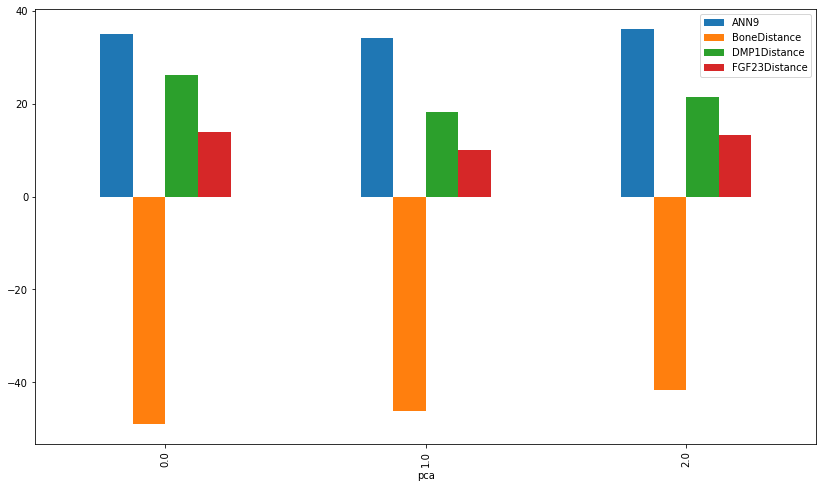

In [178]:
avgspca.plot.bar(figsize = (14,8))